In [2]:
##############################################################################################
############BIOM/SYSC 5405, Pattern Classificaiton and Experimental Design####################
############################## Project 5405## ################################################
################################### TUHEEN AHMMED, Nov 29, 2021 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

import pandas as pd
import csv
import seaborn as sea
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold, StratifiedKFold, train_test_split, cross_validate, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

# rows#
pd.set_option('display.max_rows', None)

# import libraries for charting and manipulations with datasets
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import random

#confusion matrix#
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import ConfusionMatrixDisplay

#######ROC########
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
# roc curve and auc score
from sklearn.datasets import make_classification
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import KFold

#####P-R curve ####

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import PrecisionRecallDisplay


from sklearn.preprocessing import StandardScaler
from sklearn.metrics import PrecisionRecallDisplay
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import auc
from matplotlib import pyplot

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import PrecisionRecallDisplay
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import auc
from matplotlib import pyplot


########## plotpy #######
import plotly_express as px
import plotly.graph_objects as go

In [3]:
###### (a)data visualization########## 
##load data, read a csv file, last two labels KIBA and label
## if kiba > 12.1 label = TRUE 
## if kiba < 12.1 label = FALSE

drug = pd.read_csv("train_data_adaboost.csv")

In [4]:
drug.head()

,G26,G26_Target Sequence_in_SMILES_perc,G26_SMILES_in_Target Sequence_perc,G26_ARRO,G26_SMILES_base,G26_SMILES_base_perc,G26_Target Sequence_base,G26_Target Sequence_base_perc,G26_fdp_SMILES_base,G26_fdp_Target Sequence_base,...,G10_Target Sequence_base,G10_Target Sequence_base_perc,G10_fdp_SMILES_base,G10_fdp_Target Sequence_base,G10_fd_SMILES_base,G10_fd_Target Sequence_base,G10_std_SMILES_dist,G10_std_Target Sequence_dist,KIBA,Label
0,5.073946,0.954991,0.062554,16.739510,5.522422,0.105597,5.062549,0.098782,-0.849394,0.036227,...,5.645625,0.120050,-0.024235,-0.640176,-0.004603,-0.058854,0.538344,-0.688681,11.900001,False
1,6.826617,0.001154,0.014306,60569.338400,5.590014,0.091748,6.158633,0.126360,0.090594,0.112054,...,5.589494,0.122443,-0.261973,-0.644310,-0.019836,-0.060652,0.032666,-0.720316,11.699999,False
2,5.177106,0.818811,0.930755,1.312142,5.556566,0.128679,5.564309,0.099924,-0.690133,-0.830831,...,5.549520,0.117385,-0.346797,-0.768549,-0.024956,-0.071758,-0.112331,-1.020784,11.300000,False
3,5.179001,0.183497,0.970300,5.616494,5.258327,0.130410,5.683928,0.086053,-0.053087,-0.884247,...,5.784208,0.118799,0.045586,-0.755603,0.018378,-0.067145,1.285098,-0.965758,11.800001,False
4,5.822746,0.029429,0.326915,103.942684,5.621003,0.101558,5.896788,0.281712,0.072129,-0.045202,...,5.631512,0.120159,-0.181766,-0.524913,-0.015458,-0.051385,0.119600,-0.458659,11.600000,False


In [5]:
#############################################################################################################
####################### Stratified Train-Test Splits for classification, 80/20 (train/test split)############
#############################################################################################################

from sklearn.model_selection import train_test_split

X= drug.drop(columns= ['KIBA' , 'Label'])
y= drug['Label']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1, stratify = y)
# summarize first 5 rows
#print(X_train)
# split again, and we should see the same split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1, stratify = y)
# summarize first 5 rows
#print(X_train)

In [6]:
##########################################################
##############  Adaboost #################################
#https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.AdaBoostClassifier.html
##########################################################
# evaluate a lda model on the dataset

from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
#import scikit-learn metrics module for accuracy calculation
from sklearn.metrics import accuracy_score


ada = AdaBoostClassifier(n_estimators= 100)
model_336_ada = ada.fit(X_train, y_train)
y_pred_ada = model_336_ada.predict(X_test)


# calculate and print model accuracy
print("AdaBoost Classifier Model Accuracy test set:", accuracy_score(y_test, y_pred_ada))

n_scores = cross_val_score(model_336_ada, X_train, y_train, scoring='accuracy')
# report performance
print('Adaboost Accuracy train: %.3f (%.3f)' % (mean(n_scores), std(n_scores)))

scores_final_test = cross_val_score(model_336_ada, X_test, y_test, scoring='accuracy')
print('Accuracy_test with std: %.3f (%.3f)' % (mean(scores_final_test), std(scores_final_test)))

AdaBoost Classifier Model Accuracy test set: 0.8148520277676288
Adaboost Accuracy train: 0.815 (0.002)
Accuracy_test with std: 0.805 (0.004)


In [7]:

#Predict the response for test dataset
y_pred = model_336_ada.predict(X_test)
print("AdaBoost Classifier Model Accuracy:", accuracy_score(y_test, y_pred))

# report performance
print('Accuracy: %.3f (%.3f)' % (mean(n_scores), std(n_scores)))

AdaBoost Classifier Model Accuracy: 0.8148520277676288
Accuracy: 0.815 (0.002)


accuracy for each fold with 215 featurs:: [0.81686362 0.81709197 0.81429469 0.81382736 0.81148664]
0.814713 accuracy with a standard deviation of 0.002081


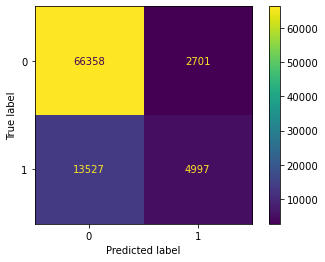

In [8]:
###### confusion matrix #######
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import ConfusionMatrixDisplay

y_pred_336 = cross_val_predict(ada, X_train, y_train, cv=5)
confusion_matrix_336 = confusion_matrix(y_train, y_pred_336)
cm_display_336 = ConfusionMatrixDisplay(confusion_matrix_336).plot()

#print(confusion_matrix_315)
scores_336 = cross_val_score(ada, X_train, y_train, scoring = "accuracy")
print("accuracy for each fold with 215 featurs::", scores_336)
print("%0.6f accuracy with a standard deviation of %0.6f" % (scores_336.mean(), scores_336.std()))



accuracy for each fold with 215 featurs:: [0.80273973 0.81023065 0.79995433 0.80703357 0.80497831]
0.804987 accuracy with a standard deviation of 0.003523


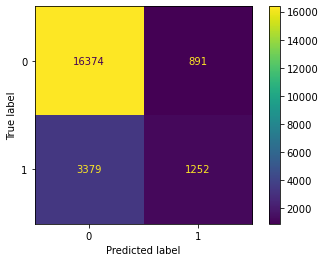

In [9]:
###### confusion matrix #######
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import ConfusionMatrixDisplay

y_pred_336_test = cross_val_predict(ada, X_test, y_test, cv=5)
confusion_matrix_336_test = confusion_matrix(y_test, y_pred_336_test)
cm_display_336_test = ConfusionMatrixDisplay(confusion_matrix_336_test).plot()

#print(confusion_matrix_315)
scores_336_test = cross_val_score(ada, X_test, y_test, scoring = "accuracy")
print("accuracy for each fold with 215 featurs::", scores_336_test)
print("%0.6f accuracy with a standard deviation of %0.6f" % (scores_336_test.mean(), scores_336_test.std()))

In [10]:
###################Performance matrics######################
################### LDA###############s model############### 
############5-fold cross validation with 336 features#######
############Confusion Matrix with 336 features##############

from sklearn.metrics import classification_report
# Confusion Matrix
from sklearn.metrics import confusion_matrix
print("confusion matrix::", confusion_matrix(y_train, y_pred_336))

# Accuracy
from sklearn.metrics import accuracy_score
print("accuracy::", accuracy_score(y_train, y_pred_336))

# precision or positive predictive value (PPV)
from sklearn.metrics import precision_score
print("precision::", precision_score(y_train, y_pred_336, average=None))

# Sensitivity/Recall/hit rate/TPR
from sklearn.metrics import recall_score
print("sensitivity/recall::",recall_score(y_train, y_pred_336, average=None))
print("")
print("")
#Classification Rreport
print(classification_report(y_train, y_pred_336))

confusion matrix:: [[66358  2701]
 [13527  4997]]
accuracy:: 0.8147129009054268
precision:: [0.83066909 0.64912964]
sensitivity/recall:: [0.96088852 0.26975815]


              precision    recall  f1-score   support

       False       0.83      0.96      0.89     69059
        True       0.65      0.27      0.38     18524

    accuracy                           0.81     87583
   macro avg       0.74      0.62      0.64     87583
weighted avg       0.79      0.81      0.78     87583



In [11]:
###################Performance matrics######################
################### LDA###############s model############### 
############5-fold cross validation with 336 features#######
############Confusion Matrix with 336 features##############

from sklearn.metrics import classification_report
# Confusion Matrix
from sklearn.metrics import confusion_matrix
print("confusion matrix::", confusion_matrix(y_test, y_pred_336_test))

# Accuracy
from sklearn.metrics import accuracy_score
print("accuracy::", accuracy_score(y_test, y_pred_336_test))

# precision or positive predictive value (PPV)
from sklearn.metrics import precision_score
print("precision::", precision_score(y_test, y_pred_336_test, average=None))

# Sensitivity/Recall/hit rate/TPR
from sklearn.metrics import recall_score
print("sensitivity/recall::",recall_score(y_test, y_pred_336_test, average=None))
print("")
print("")
#Classification Rreport
print(classification_report(y_test, y_pred_336_test))

confusion matrix:: [[16374   891]
 [ 3379  1252]]
accuracy:: 0.8049872122762148
precision:: [0.82893738 0.58422772]
sensitivity/recall:: [0.9483927  0.27035198]


              precision    recall  f1-score   support

       False       0.83      0.95      0.88     17265
        True       0.58      0.27      0.37      4631

    accuracy                           0.80     21896
   macro avg       0.71      0.61      0.63     21896
weighted avg       0.78      0.80      0.78     21896



adaboost PR AUC: 0.529


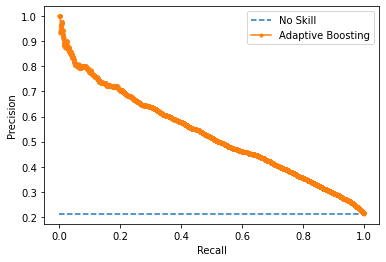

              x         y
0      1.000000  0.213194
1      0.999784  0.213158
2      0.999784  0.213168
3      0.999784  0.213177
4      0.999784  0.213187
5      0.999784  0.213197
6      0.999784  0.213207
7      0.999784  0.213217
8      0.999784  0.213226
9      0.999784  0.213236
10     0.999784  0.213246
11     0.999784  0.213256
12     0.999784  0.213266
13     0.999784  0.213276
14     0.999784  0.213285
15     0.999784  0.213295
16     0.999784  0.213305
17     0.999784  0.213315
18     0.999784  0.213325
19     0.999784  0.213335
20     0.999784  0.213344
21     0.999784  0.213354
22     0.999784  0.213364
23     0.999784  0.213374
24     0.999784  0.213384
25     0.999784  0.213403
26     0.999784  0.213413
27     0.999784  0.213423
28     0.999784  0.213433
29     0.999784  0.213443
30     0.999784  0.213453
31     0.999784  0.213462
32     0.999784  0.213472
33     0.999784  0.213482
34     0.999784  0.213492
35     0.999784  0.213502
36     0.999784  0.213512
37     0.999

In [12]:
#############################################################
###########Precision-recall curve with 336 features--modified##########
#############################################################

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import PrecisionRecallDisplay
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import auc
from matplotlib import pyplot

#model_336 = AdaBoostClassifier(n_estimators=100)
#model_336.fit(X_train, y_train)

#ada = AdaBoostClassifier(n_estimators=100)
#ada.fit(X_train, y_train)

#model_336_pr = AdaBoostClassifier(n_estimators=100)
#model_336_pr.fit(X_train, y_train)
#y_pred_336_pr = cross_val_predict(model_336_pr, X_train, y_train, cv = 7)

#display = PrecisionRecallDisplay.from_predictions(y_train, y_pred_336_pr, name="LDA, 5-fold CV")
#_ = display.ax_.set_title("Precision-Recall curve # 336 features")


# plot no skill and model precision-recall curves
def plot_pr_curve(y_test, model_probs):
	# calculate the no skill line as the proportion of the positive class
	no_skill = len(y_test[y_test==1]) / len(y_test)
	# plot the no skill precision-recall curve
	pyplot.plot([0, 1], [no_skill, no_skill], linestyle='--', label='No Skill')
	# plot model precision-recall curve
	precision, recall, _ = precision_recall_curve(y_test, model_probs)
	pyplot.plot(recall, precision, marker='.', label='Adaptive Boosting')
	# axis labels
	pyplot.xlabel('Recall')
	pyplot.ylabel('Precision')
	# show the legend
	pyplot.legend()
	# show the plot
	pyplot.show()
    

#ada = AdaBoostClassifier(n_estimators= 100)
#model_336_ada = ada.fit(X_train, y_train)
#y_pred_ada = model_336_ada.predict(X_test)



model_336_pr = AdaBoostClassifier(n_estimators=100)
model_336_pr_final = model_336_pr.fit(X_train, y_train)
yhat = model_336_pr_final.predict_log_proba(X_test)
model_probs = yhat[:, 1]
# calculate the precision-recall auc
precision, recall, _ = precision_recall_curve(y_test, model_probs)
auc_score = auc(recall, precision)
print('adaboost PR AUC: %.3f' % auc_score)
# plot precision-recall curves
plot_pr_curve(y_test, model_probs)


df = pd.DataFrame(dict(x = recall,y = precision))
df.to_csv('ldaa.csv')
print(df)
fig = px.line(df, x='x', y='y', title='Precision Recall Curve, LDA')
fig.update_layout(hovermode='closest',template='seaborn',width=700,xaxis=dict(mirror=True,linewidth=2,linecolor='black',showgrid=False),
                 yaxis=dict(mirror=True,linewidth=2,linecolor='black'))



In [13]:
pd.read_csv("ldaa.csv")

,Unnamed: 0,x,y
0,0,1.000000,0.213194
1,1,0.999784,0.213158
2,2,0.999784,0.213168
3,3,0.999784,0.213177
4,4,0.999784,0.213187
5,5,0.999784,0.213197
6,6,0.999784,0.213207
7,7,0.999784,0.213217
8,8,0.999784,0.213226
9,9,0.999784,0.213236


In [16]:
stdev_ada = pd.read_csv("ldaa.csv")

import statistics
statistics.stdev(stdev_ada.y)

0.15809393292047774

/Users/tuheenahmmed/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:445: UserWarning:

X does not have valid feature names, but AdaBoostClassifier was fitted with feature names



ValueError: X has 2 features, but AdaBoostClassifier is expecting 336 features as input.

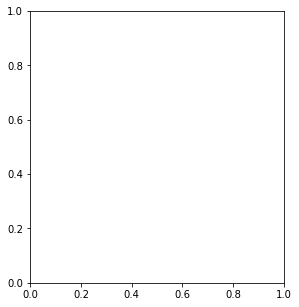

In [14]:
# Author: Noel Dawe <noel.dawe@gmail.com>
#
# License: BSD 3 clause

import numpy as np
import matplotlib.pyplot as plt

from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.datasets import make_gaussian_quantiles



# Create and fit an AdaBoosted decision tree
bdt = AdaBoostClassifier(
    DecisionTreeClassifier(max_depth=1), algorithm="SAMME", n_estimators=200
)

bdt.fit(X_train, y_train)

plot_colors = "br"
plot_step = 0.02
class_names = "AB"

plt.figure(figsize=(10, 5))

# Plot the decision boundaries
plt.subplot(121)
x_min, x_max = X_train.iloc[:, 0].min() - 1, X_train.iloc[:, 0].max() + 1
y_min, y_max = X_train.iloc[:, 1].min() - 1, X_train.iloc[:, 1].max() + 1
xx, yy = np.meshgrid(
    np.arange(x_min, x_max, plot_step), np.arange(y_min, y_max, plot_step)
)

Z = bdt.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)
cs = plt.contourf(xx, yy, Z, cmap=plt.cm.Paired)
plt.axis("tight")

# Plot the training points
for i, n, c in zip(range(2), class_names, plot_colors):
    idx = np.where(y_train == i)
    plt.scatter(
        X_train[idx, 0],
        X_train[idx, 1],
        c=c,
        cmap=plt.cm.Paired,
        s=20,
        edgecolor="k",
        label="Class %s" % n,
    )
plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.legend(loc="upper right")
plt.xlabel("x")
plt.ylabel("y")
plt.title("Decision Boundary")

# Plot the two-class decision scores
twoclass_output = bdt.decision_function(X_train)
plot_range = (twoclass_output.min(), twoclass_output.max())
plt.subplot(122)
for i, n, c in zip(range(2), class_names, plot_colors):
    plt.hist(
        twoclass_output[y == i],
        bins=10,
        range=plot_range,
        facecolor=c,
        label="Class %s" % n,
        alpha=0.5,
        edgecolor="k",
    )
x1, x2, y1, y2 = plt.axis()
plt.axis((x1, x2, y1, y2 * 1.2))
plt.legend(loc="upper right")
plt.ylabel("Samples")
plt.xlabel("Score")
plt.title("Decision Scores")

plt.tight_layout()
plt.subplots_adjust(wspace=0.35)
plt.show()

